In [1]:
import os
import pandas as pd   # importing and manipulating data
import numpy as np    # for performing linear algebric functions
import matplotlib.pyplot as plt    #visualization of data
plt.style.use('ggplot')
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import re
from nltk.tokenize import WordPunctTokenizer
tok = WordPunctTokenizer()


import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

from wordcloud import WordCloud, STOPWORDS

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

from iso3166 import countries

In [2]:
march_df = pd.read_csv('E:/Project 5 credits/Final Project/March 2020/march new.csv',lineterminator='\n')
march_df.head()

,Unnamed: 0,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,reply_to_screen_name,...,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_lang,account_created_at,verified,lang\r
0,0,1244051646071611394,860252856829587457,2020-03-29T00:00:00Z,IMSS_SanLuis,"Ante cualquier enfermedad respiratoria, no te ...",TweetDeck,NaN,NaN,NaN,...,0,NaN,NaN,NaN,1008,41,NaN,2017-05-04T22:00:38Z,False,es\r
1,1,1244051645039706112,1125933654943895553,2020-03-29T00:00:00Z,intrac_ccs,#ATENCIÓN En el Terminal Nuevo Circo se implem...,TweetDeck,NaN,NaN,NaN,...,1,NaN,NaN,NaN,90,316,NaN,2019-05-08T01:21:16Z,False,es\r
2,2,1244051645975191557,80943559,2020-03-29T00:00:00Z,rlieving,“People are just storing up. They are staying ...,TweetDeck,NaN,NaN,NaN,...,0,NaN,NaN,NaN,136,457,NaN,2009-10-08T21:06:08Z,False,en\r
3,3,1244051646750928897,817072420947247104,2020-03-29T00:00:00Z,Tu_IMSS_Coah,"Si empezaste a trabajar, necesitas dar de alta...",TweetDeck,NaN,NaN,NaN,...,0,NaN,NaN,NaN,1549,170,NaN,2017-01-05T18:17:00Z,False,es\r
4,4,1244051647032102914,788863557349670913,2020-03-29T00:00:00Z,Tabasco_IMSS,Una sociedad informada está mejor preparada an...,TweetDeck,NaN,NaN,NaN,...,0,NaN,NaN,NaN,868,125,NaN,2016-10-19T22:05:03Z,False,es\r


In [3]:
march_df.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 23 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            100000 non-null  int64  
 1   status_id             100000 non-null  int64  
 2   user_id               100000 non-null  int64  
 3   created_at            100000 non-null  object 
 4   screen_name           100000 non-null  object 
 5   text                  100000 non-null  object 
 6   source                99999 non-null   object 
 7   reply_to_status_id    13722 non-null   float64
 8   reply_to_user_id      16451 non-null   float64
 9   reply_to_screen_name  16451 non-null   object 
 10  is_quote              100000 non-null  bool   
 11  is_retweet            100000 non-null  bool   
 12  favourites_count      100000 non-null  int64  
 13  retweet_count         100000 non-null  int64  
 14  country_code          5998 non-null    object 
 15  p

In [4]:
march_df.describe()

,Unnamed: 0,status_id,user_id,reply_to_status_id,reply_to_user_id,favourites_count,retweet_count,followers_count,friends_count,account_lang
count,100000.000000,1.000000e+05,1.000000e+05,1.372200e+04,1.645100e+04,1.000000e+05,100000.000000,1.000000e+05,100000.000000,0.0
mean,49999.500000,1.244095e+18,3.539460e+17,1.243280e+18,2.424857e+17,1.325225e+04,4.601490,6.205379e+04,2053.090460,NaN
std,28867.657797,2.679600e+13,5.035874e+17,2.046670e+16,4.410470e+17,3.891545e+04,83.844965,5.670573e+05,10512.439401,NaN
min,0.000000,1.244052e+18,2.650000e+02,6.944339e+16,1.688000e+03,0.000000e+00,0.000000,0.000000e+00,0.000000,NaN
25%,24999.750000,1.244072e+18,1.582089e+08,1.243968e+18,5.703351e+07,2.420000e+02,0.000000,1.020000e+02,138.000000,NaN
50%,49999.500000,1.244093e+18,1.338073e+09,1.244057e+18,3.521575e+08,1.908000e+03,0.000000,5.630000e+02,462.500000,NaN
75%,74999.250000,1.244118e+18,9.073814e+17,1.244091e+18,4.074532e+09,9.738000e+03,1.000000,3.054000e+03,1391.000000,NaN
max,99999.000000,1.244143e+18,1.244141e+18,1.244143e+18,1.244121e+18,1.534975e+06,13611.000000,1.581754e+07,641802.000000,NaN


In [5]:
print('Shape of tweets dataframe : {}'.format(march_df.shape))

Shape of tweets dataframe : (100000, 23)


c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning:

Glyph 13 missing from current font.

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning:

Glyph 13 missing from current font.



<AxesSubplot:>

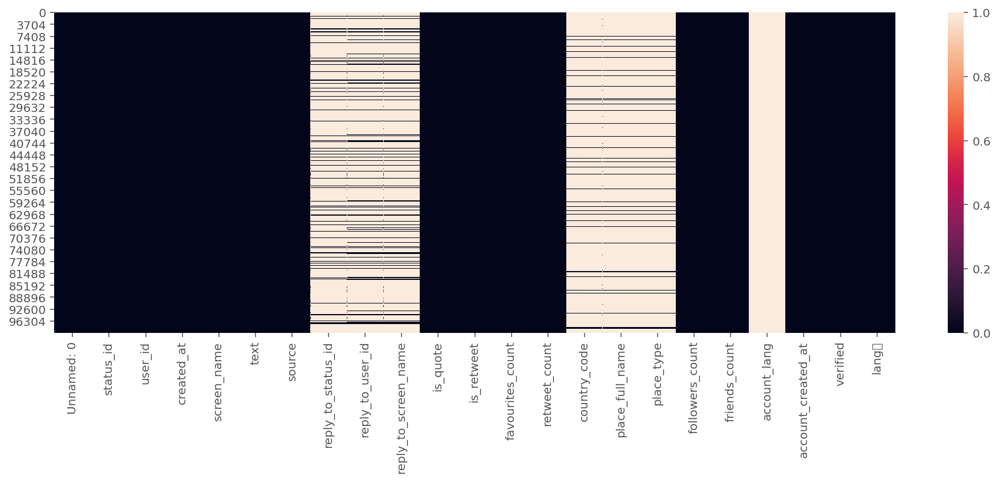

In [6]:
plt.figure(figsize = (16,5))
sns.heatmap(march_df.isnull())

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

def return_missing_values(data_frame):
    missing_values = data_frame.isnull().sum()/len(data_frame)
    missing_values = missing_values[missing_values>0]
    missing_values.sort_values(inplace=True)
    return missing_values

def plot_missing_values(data_frame):
    missing_values = return_missing_values(data_frame)
    missing_values = missing_values.to_frame()
    missing_values.columns = ['Precentage']
    missing_values.index.names = ['Name']
    missing_values['Name'] = missing_values.index
    sns.set(style='whitegrid', color_codes=True)
    sns.barplot(x='Name', y='Precentage', data=missing_values)
    plt.xticks(rotation=90)
    plt.show()

In [8]:
return_missing_values(march_df)

source                  0.00001
reply_to_user_id        0.83549
reply_to_screen_name    0.83549
reply_to_status_id      0.86278
place_full_name         0.93971
place_type              0.93971
country_code            0.94002
account_lang            1.00000
dtype: float64

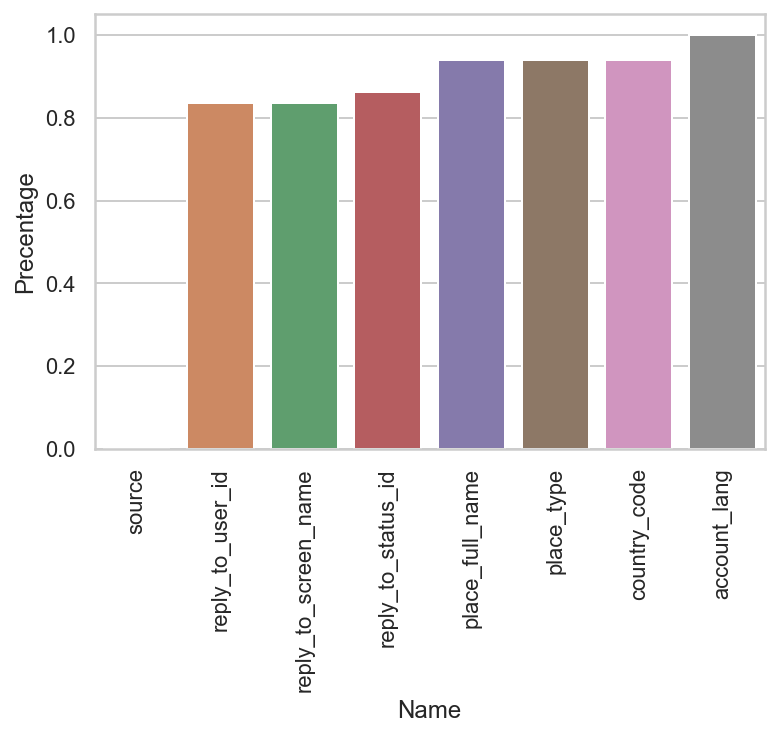

In [9]:
plot_missing_values(march_df)

In [10]:
march_df.corr()

,Unnamed: 0,status_id,user_id,reply_to_status_id,reply_to_user_id,is_quote,is_retweet,favourites_count,retweet_count,followers_count,friends_count,account_lang,verified
Unnamed: 0,1.000000,0.998907,0.032687,-0.001602,0.004726,-0.017568,NaN,-0.025248,-0.008662,0.022565,-0.018359,NaN,0.028883
status_id,0.998907,1.000000,0.032897,-0.001303,0.004759,-0.017948,NaN,-0.025788,-0.008937,0.022785,-0.018585,NaN,0.029829
user_id,0.032687,0.032897,1.000000,0.004768,0.304102,-0.051790,NaN,-0.105449,-0.009430,-0.073795,-0.085643,NaN,-0.147739
reply_to_status_id,-0.001602,-0.001303,0.004768,1.000000,0.016857,-0.015926,NaN,-0.002433,0.002826,0.002072,0.000086,NaN,0.007729
reply_to_user_id,0.004726,0.004759,0.304102,0.016857,1.000000,-0.043769,NaN,-0.035079,-0.003237,-0.028484,-0.016071,NaN,-0.041857
is_quote,-0.017568,-0.017948,-0.051790,-0.015926,-0.043769,1.000000,NaN,0.091813,-0.001522,-0.036882,-0.005723,NaN,-0.053446
is_retweet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
favourites_count,-0.025248,-0.025788,-0.105449,-0.002433,-0.035079,0.091813,NaN,1.000000,0.010405,-0.022002,0.185975,NaN,-0.041534
retweet_count,-0.008662,-0.008937,-0.009430,0.002826,-0.003237,-0.001522,NaN,0.010405,1.000000,0.067611,0.009789,NaN,0.086716
followers_count,0.022565,0.022785,-0.073795,0.002072,-0.028484,-0.036882,NaN,-0.022002,0.067611,1.000000,0.033500,NaN,0.335906


Text(0.5, 1.0, 'Correlation Heatmap')

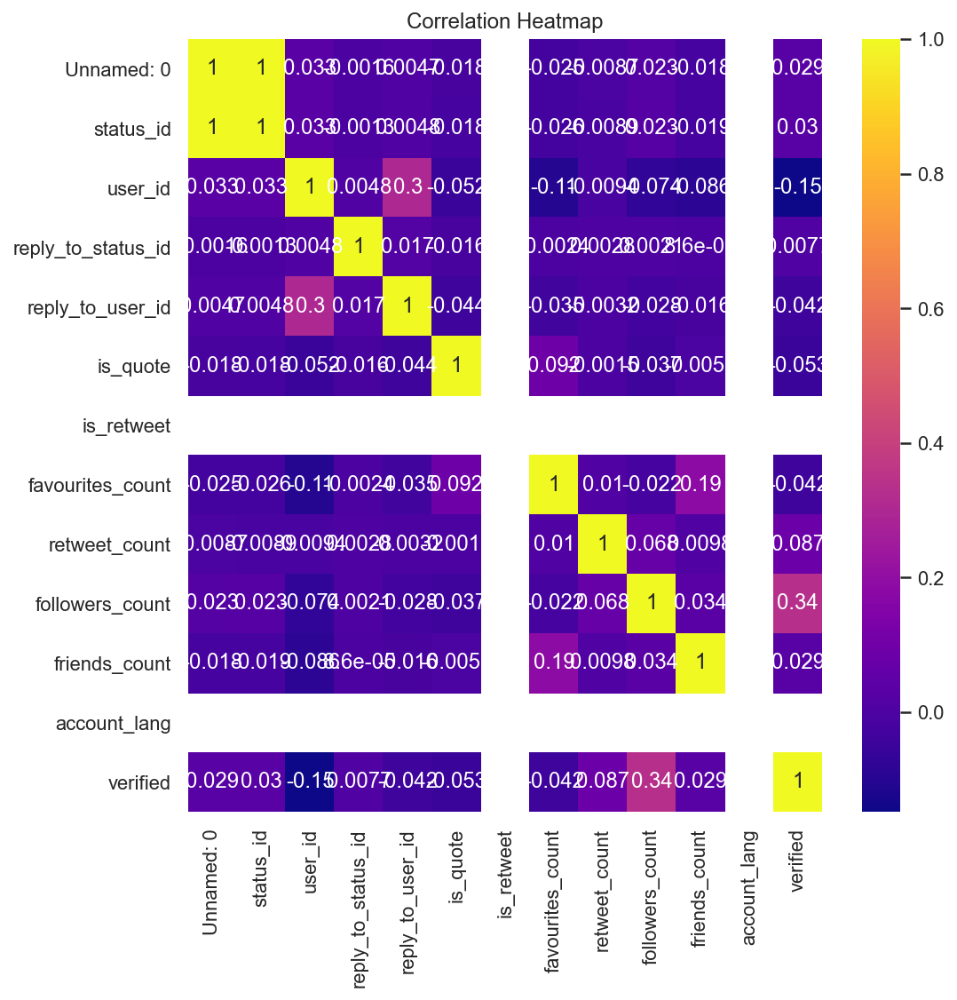

In [11]:
plt.figure(figsize=(8,8))
sns.heatmap(march_df.corr(), annot=True, cmap="plasma").set_title('Correlation Heatmap')

In [12]:
march_df = march_df.rename(columns={'screen_name': 'user_name'})

In [13]:
df_new = march_df['user_name'].value_counts().reset_index()
df_new.columns = ['user_name', 'tweets_count']
df_new = df_new.sort_values(['tweets_count'])

fig = px.bar(
    df_new.tail(20), 
    x="tweets_count", 
    y="user_name", 
    orientation='h', 
    title='Top 20 users by number of tweets', 
    width=800, 
    height=800
)

fig.show()

In [14]:
df_new.tail(10)

,user_name,tweets_count
9,VetrepreneurOne,50
8,zazoomblog,51
7,zazoomnews,52
6,mirthalegrand,63
5,nicd_sa,67
4,Only_rock_radio,68
3,kr3at,68
2,lasopapuntocom,84
1,TomthunkitsMind,126
0,openletterbot,180


In [15]:
march_df= pd.merge(march_df, df_new, on='user_name')

In [16]:
march_df.head(5)

,Unnamed: 0,status_id,user_id,created_at,user_name,text,source,reply_to_status_id,reply_to_user_id,reply_to_screen_name,...,country_code,place_full_name,place_type,followers_count,friends_count,account_lang,account_created_at,verified,lang\r,tweets_count
0,0,1244051646071611394,860252856829587457,2020-03-29T00:00:00Z,IMSS_SanLuis,"Ante cualquier enfermedad respiratoria, no te ...",TweetDeck,NaN,NaN,NaN,...,NaN,NaN,NaN,1008,41,NaN,2017-05-04T22:00:38Z,False,es\r,9
1,28478,1244074294314971137,860252856829587457,2020-03-29T01:30:00Z,IMSS_SanLuis,"Asegura sus beneficios, registra a tu madre y/...",TweetDeck,NaN,NaN,NaN,...,NaN,NaN,NaN,1008,41,NaN,2017-05-04T22:00:38Z,False,es\r,9
2,37593,1244082111436320769,860252856829587457,2020-03-29T02:01:03Z,IMSS_SanLuis,Convocatoria Abierta Nacional 2020. \nBuscamos...,Twitter for iPhone,NaN,NaN,NaN,...,NaN,NaN,NaN,1008,41,NaN,2017-05-04T22:00:38Z,False,es\r,9
3,37811,1244082348368384000,860252856829587457,2020-03-29T02:02:00Z,IMSS_SanLuis,En el #IMSS contamos con los mejores profesion...,Twitter for iPhone,NaN,NaN,NaN,...,NaN,NaN,NaN,1008,41,NaN,2017-05-04T22:00:38Z,False,es\r,9
4,45937,1244089584247427073,860252856829587457,2020-03-29T02:30:45Z,IMSS_SanLuis,Uno de nuestros mejores profesionales al servi...,Twitter for iPhone,NaN,NaN,NaN,...,NaN,NaN,NaN,1008,41,NaN,2017-05-04T22:00:38Z,False,es\r,9


In [17]:
march_df = march_df.rename(columns={'followers_count': 'user_followers'})

In [18]:
data = march_df.sort_values('user_followers', ascending=False)
data = data.drop_duplicates(subset='user_name', keep="first")
data = data[['user_name', 'user_followers', 'tweets_count']]
data = data.sort_values('user_followers')

fig = px.bar(
    data.tail(20), 
    x="user_followers", 
    y="user_name", 
    color='tweets_count',
    orientation='h', 
    title='Top 20 users by number of followers', 
    width=800, 
    height=800
)

fig.show()

In [19]:
data.tail(5)

,user_name,user_followers,tweets_count
27548,ndtv,12391285,37
41274,timesofindia,12504550,28
7126,XHNews,12654975,13
54,CGTNOfficial,14040252,22
58633,detikcom,15817536,3


In [20]:
march_df = march_df.rename(columns={'account_created_at': 'user_created'})

In [21]:
march_df['user_created'] = pd.to_datetime(march_df['user_created'])
march_df['year_created'] = march_df['user_created'].dt.year
data = march_df.drop_duplicates(subset='user_name', keep="first")
data = data[data['year_created']>1970]
data = data['year_created'].value_counts().reset_index()
data.columns = ['year', 'number']

fig = px.bar(
    data, 
    x="year", 
    y="number", 
    orientation='v', 
    title='User created year by year', 
    width=800, 
    height=600
)

fig.show()

In [22]:
data.head()

,year,number
0,2009,10279
1,2010,7599
2,2019,7294
3,2011,7276
4,2012,5580


In [23]:
march_df = march_df.rename(columns={'country_code': 'user_location'})

In [24]:
ds = march_df['user_location'].value_counts().reset_index()
ds.columns = ['user_location', 'count']
ds = ds[ds['user_location']!='NA']
ds = ds.sort_values(['count'])

fig = px.bar(
    ds.tail(20), 
    x="count", 
    y="user_location", 
    orientation='h', title='Top 20 user locations by number of tweets', 
    width=800, 
    height=800
)

fig.show()

In [25]:
ds.head()

,user_location,count
129,MN,1
106,LS,1
105,FI,1
104,AD,1
103,KZ,1


In [26]:
def pie_count(data, field, percent_limit, title):
    
    data[field] = data[field].fillna('NA')
    data = data[field].value_counts().to_frame()

    total = data[field].sum()
    data['percentage'] = 100 * data[field]/total    

    percent_limit = percent_limit
    otherdata = data[data['percentage'] < percent_limit] 
    others = otherdata['percentage'].sum()  
    maindata = data[data['percentage'] >= percent_limit]

    data = maindata
    other_label = "Others(<" + str(percent_limit) + "% each)"
    data.loc[other_label] = pd.Series({field:otherdata[field].sum()}) 
    
    labels = data.index.tolist()   
    datavals = data[field].tolist()
    
    trace=go.Pie(labels=labels,values=datavals)

    layout = go.Layout(
        title = title,
        height=600,
        width=600
        )
    
    fig = go.Figure(data=[trace], layout=layout)
    iplot(fig)
    
pie_count(march_df, 'user_location', 0.5, 'Number of tweets per location')

In [27]:
from string import punctuation
from nltk.corpus import stopwords
print(stopwords.words('english')[10:15])

def punctuation_stopwords_removal(sms):
    # filters charecter-by-charecter : ['h', 'e', 'e', 'l', 'o', 'o', ' ', 'm', 'y', ' ', 'n', 'a', 'm', 'e', ' ', 'i', 's', ' ', 'p', 'u', 'r', 'v', 'a']
    remove_punctuation = [ch for ch in sms if ch not in punctuation]
    # convert them back to sentences and split into words
    remove_punctuation = "".join(remove_punctuation).split()
    filtered_sms = [word.lower() for word in remove_punctuation if word.lower() not in stopwords.words('english')]
    return filtered_sms

["you've", "you'll", "you'd", 'your', 'yours']


In [28]:
from wordcloud import WordCloud, STOPWORDS


def draw_word_cloud(df, location, title):
    loc_df = df.loc[df.user_location==location]
    loc_df.loc[:, 'text'] = loc_df['text'].apply(punctuation_stopwords_removal)
    word_cloud = WordCloud(
                    background_color='black',
                    stopwords=set(STOPWORDS),
                    max_words=100,
                    max_font_size=50,
                    scale=5,
                    random_state=1).generate(str(loc_df['text']))
    fig = plt.figure(1, figsize=(10,10))
    plt.axis('off')
    fig.suptitle(title, fontsize=20)
    fig.subplots_adjust(top=2.3)
    plt.imshow(word_cloud)
    plt.show()    

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



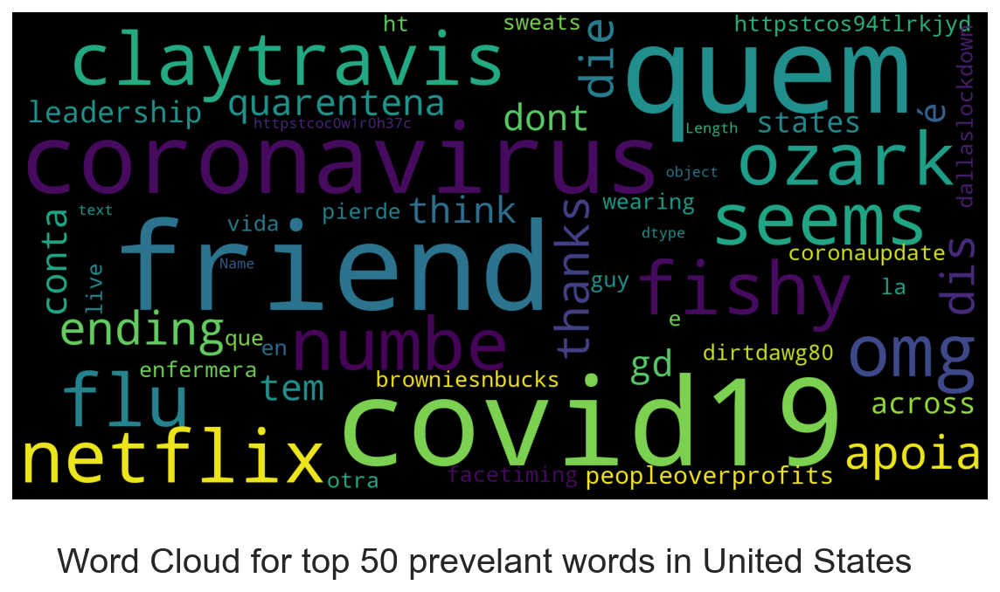

In [29]:
draw_word_cloud(march_df, 'US', 'Word Cloud for top 50 prevelant words in United States')

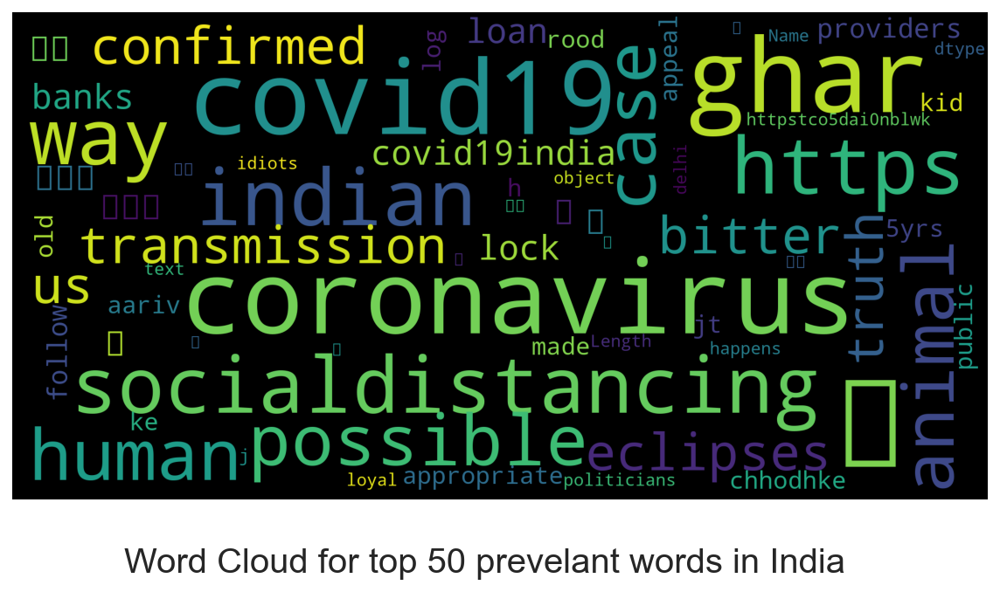

In [30]:
draw_word_cloud(march_df, 'IN', 'Word Cloud for top 50 prevelant words in India')

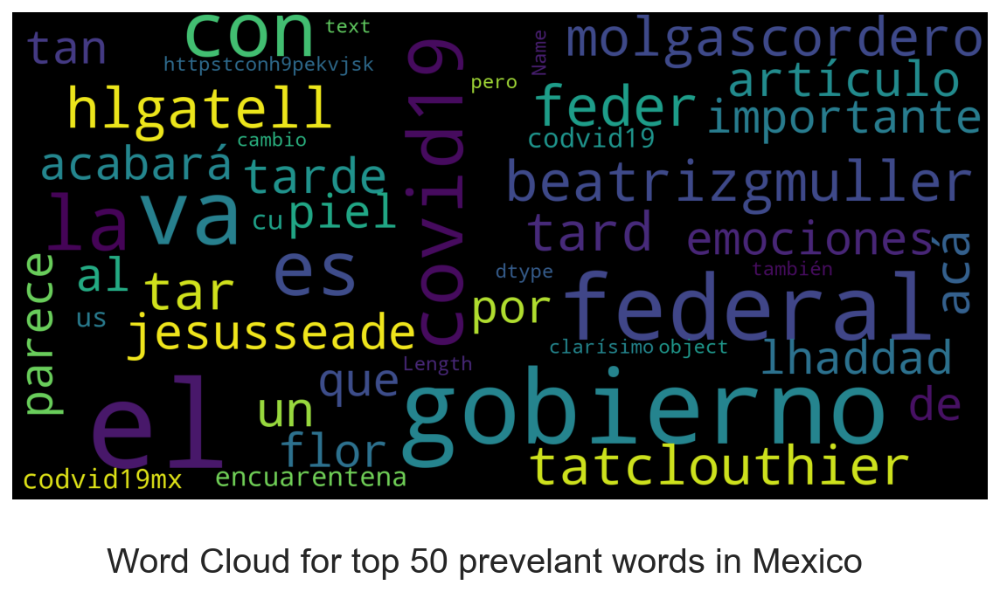

In [31]:
draw_word_cloud(march_df, 'MX', 'Word Cloud for top 50 prevelant words in Mexico')

In [32]:
#Just split day and time into separate columns

march_df['date'] = pd.to_datetime(march_df['created_at']) 
march_df = march_df.sort_values(['date'])
march_df['day'] = march_df['date'].astype(str).str.split(' ', expand=True)[0]
march_df['time'] = march_df['date'].astype(str).str.split(' ', expand=True)[1]
march_df.head()

,Unnamed: 0,status_id,user_id,created_at,user_name,text,source,reply_to_status_id,reply_to_user_id,reply_to_screen_name,...,friends_count,account_lang,user_created,verified,lang\r,tweets_count,year_created,date,day,time
0,0,1244051646071611394,860252856829587457,2020-03-29T00:00:00Z,IMSS_SanLuis,"Ante cualquier enfermedad respiratoria, no te ...",TweetDeck,NaN,NaN,NaN,...,41,NaN,2017-05-04 22:00:38+00:00,False,es\r,9,2017,2020-03-29 00:00:00+00:00,2020-03-29,00:00:00+00:00
275,42,1244051646138789888,2890850489,2020-03-29T00:00:00Z,AirtelUFootball,.@CelticFC manager Neil Lennon says his player...,TweetDeck,NaN,NaN,NaN,...,18,NaN,2014-11-24 14:53:36+00:00,False,en\r,2,2014,2020-03-29 00:00:00+00:00,2020-03-29,00:00:00+00:00
277,43,1244051646038052865,54664898,2020-03-29T00:00:00Z,TownofNewmarket,We're powering down our buildings and marquee ...,Twitter for Advertisers,NaN,NaN,NaN,...,1630,NaN,2009-07-07 20:27:26+00:00,True,en\r,1,2009,2020-03-29 00:00:00+00:00,2020-03-29,00:00:00+00:00
278,44,1244051646029524994,2400082873,2020-03-29T00:00:00Z,gorebiobio,#Toquedequeda Desde las 22:00 horas y hasta la...,Twitter Media Studio,NaN,NaN,NaN,...,851,NaN,2014-03-20 15:52:27+00:00,True,es\r,1,2014,2020-03-29 00:00:00+00:00,2020-03-29,00:00:00+00:00
279,45,1244051645995995136,3428726986,2020-03-29T00:00:00Z,FacMedicinaUC,#MedUC junto a la Red de Salud @ucchristus rea...,TweetDeck,NaN,NaN,NaN,...,1009,NaN,2015-08-17 19:00:19+00:00,False,es\r,1,2015,2020-03-29 00:00:00+00:00,2020-03-29,00:00:00+00:00


In [33]:
march_df['hour'] = march_df['date'].dt.hour
ds = march_df['hour'].value_counts().reset_index()
ds.columns = ['hour', 'count']
ds['hour'] = 'Hour ' + ds['hour'].astype(str)
fig = px.bar(
    ds, 
    x="hour", 
    y="count", 
    orientation='v', 
    title='Tweets distribution over hours', 
    width=800
)
fig.show()

In [34]:
march_df.head(3)

,Unnamed: 0,status_id,user_id,created_at,user_name,text,source,reply_to_status_id,reply_to_user_id,reply_to_screen_name,...,account_lang,user_created,verified,lang\r,tweets_count,year_created,date,day,time,hour
0,0,1244051646071611394,860252856829587457,2020-03-29T00:00:00Z,IMSS_SanLuis,"Ante cualquier enfermedad respiratoria, no te ...",TweetDeck,NaN,NaN,NaN,...,NaN,2017-05-04 22:00:38+00:00,False,es\r,9,2017,2020-03-29 00:00:00+00:00,2020-03-29,00:00:00+00:00,0
275,42,1244051646138789888,2890850489,2020-03-29T00:00:00Z,AirtelUFootball,.@CelticFC manager Neil Lennon says his player...,TweetDeck,NaN,NaN,NaN,...,NaN,2014-11-24 14:53:36+00:00,False,en\r,2,2014,2020-03-29 00:00:00+00:00,2020-03-29,00:00:00+00:00,0
277,43,1244051646038052865,54664898,2020-03-29T00:00:00Z,TownofNewmarket,We're powering down our buildings and marquee ...,Twitter for Advertisers,NaN,NaN,NaN,...,NaN,2009-07-07 20:27:26+00:00,True,en\r,1,2009,2020-03-29 00:00:00+00:00,2020-03-29,00:00:00+00:00,0


In [35]:
march_df.drop(['Unnamed: 0','status_id','user_id','user_location','source','reply_to_status_id','reply_to_user_id','user_created','reply_to_screen_name','account_lang','user_created','verified','user_followers','date','hour','created_at','is_quote','is_retweet','favourites_count','retweet_count','place_type','friends_count','year_created','place_full_name'], axis = 1, inplace = True)
march_df.drop_duplicates()
march_df.head(2)

,user_name,text,lang\r,tweets_count,day,time
0,IMSS_SanLuis,"Ante cualquier enfermedad respiratoria, no te ...",es\r,9,2020-03-29,00:00:00+00:00
275,AirtelUFootball,.@CelticFC manager Neil Lennon says his player...,en\r,2,2020-03-29,00:00:00+00:00


In [36]:
march_df = march_df.rename(columns={'text': 'tweet', 'day': 'date'})
march_df.head()

,user_name,tweet,lang\r,tweets_count,date,time
0,IMSS_SanLuis,"Ante cualquier enfermedad respiratoria, no te ...",es\r,9,2020-03-29,00:00:00+00:00
275,AirtelUFootball,.@CelticFC manager Neil Lennon says his player...,en\r,2,2020-03-29,00:00:00+00:00
277,TownofNewmarket,We're powering down our buildings and marquee ...,en\r,1,2020-03-29,00:00:00+00:00
278,gorebiobio,#Toquedequeda Desde las 22:00 horas y hasta la...,es\r,1,2020-03-29,00:00:00+00:00
279,FacMedicinaUC,#MedUC junto a la Red de Salud @ucchristus rea...,es\r,1,2020-03-29,00:00:00+00:00


In [37]:
#As words are in the order of csv files we imported , we have to shuffle the rows & Reindex

march_df = march_df.sample(frac=1).reset_index(drop=True)
march_df.head()

,user_name,tweet,lang\r,tweets_count,date,time
0,heather_hear,“[w]orkers supporting the operation of firearm...,en\r,8,2020-03-29,02:17:02+00:00
1,otakopup,@NikoNe_san_2525 加害者のクセして被害者面、ヒーロー面して謝罪の一つも無くの...,ja\r,1,2020-03-29,00:57:10+00:00
2,democraziait,ASSOLUTAMENTE #INADEGUATE e #INCAPACI!! LA DIS...,it\r,1,2020-03-29,00:17:19+00:00
3,shiusolih,BREAKING : Sample taken from a Maldivian natio...,en\r,1,2020-03-29,05:36:53+00:00
4,Hailedbycritics,I’m beginning to understand the need for Shirl...,en\r,1,2020-03-29,01:03:19+00:00


In [38]:
march_df = march_df[march_df['lang\r'] == 'en\r']
march_df.head()

,user_name,tweet,lang\r,tweets_count,date,time
0,heather_hear,“[w]orkers supporting the operation of firearm...,en\r,8,2020-03-29,02:17:02+00:00
3,shiusolih,BREAKING : Sample taken from a Maldivian natio...,en\r,1,2020-03-29,05:36:53+00:00
4,Hailedbycritics,I’m beginning to understand the need for Shirl...,en\r,1,2020-03-29,01:03:19+00:00
6,DoctorCommunist,The hero we need. @greenlegocats @MinigunnerYT...,en\r,1,2020-03-29,00:22:12+00:00
7,LiquidD81,Meme shitlords were sharing this Umbrella Corp...,en\r,1,2020-03-29,02:07:00+00:00


In [39]:
march_df.info(null_counts=True)

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

null_counts is deprecated. Use show_counts instead



<class 'pandas.core.frame.DataFrame'>
Int64Index: 56618 entries, 0 to 99997
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   user_name     56618 non-null  object
 1   tweet         56618 non-null  object
         56618 non-null  object
 3   tweets_count  56618 non-null  int64 
 4   date          56618 non-null  object
 5   time          56618 non-null  object
dtypes: int64(1), object(5)
memory usage: 3.0+ MB


In [40]:
march_df = pd.concat([march_df], ignore_index=True)

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections
import re
import networkx as nx

import nltk
from nltk.corpus import stopwords
stopwords=set(stopwords.words('english'))
from nltk.util import ngrams
from nltk import bigrams
nltk.download('stopwords')

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
%config InlineBackend.figure_format = 'retina'

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nimes\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [42]:
df_new = march_df[march_df['tweet'].notnull()]
df_new['text'] = df_new['tweet'].apply(lambda x: ' '.join([item for item in x.split() if item not in stopwords]))
print(df_new)

             user_name                                              tweet  \
0         heather_hear  “[w]orkers supporting the operation of firearm...   
1            shiusolih  BREAKING : Sample taken from a Maldivian natio...   
2      Hailedbycritics  I’m beginning to understand the need for Shirl...   
3      DoctorCommunist  The hero we need. @greenlegocats @MinigunnerYT...   
4            LiquidD81  Meme shitlords were sharing this Umbrella Corp...   
...                ...                                                ...   
56613           VanSgt  Tonight LPS members  recognize the efforts of ...   
56614     Will_NeSmith  Some local kids decorated our #ICU bulletin bo...   
56615     We_The_Truth  Let’s just make it clear...\n@realDonaldTrump ...   
56616        ShurjoAli  @GovPritzker So what you are telling us is tha...   
56617    kristyy_babyy  Anyone else tired of #COVID19 as the topic of ...   

      lang\r  tweets_count        date            time  \
0       en\r     

In [43]:
#Remove Urls and HTML links
def remove_urls(text):
    url_remove = re.compile(r'https?://\S+|www\.\S+')
    return url_remove.sub(r'', text)
df_new['text']=df_new['text'].apply(lambda x:remove_urls(x))

def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)
df_new['text']=df_new['text'].apply(lambda x:remove_html(x))

# Lower casing
def lower(text):
    low_text= text.lower()
    return low_text
df_new['text']=df_new['text'].apply(lambda x:lower(x))

# Number removal
def remove_num(text):
    remove= re.sub(r'\d+', '', text)
    return remove
df_new['text']=df_new['text'].apply(lambda x:remove_num(x))

def punct_remove(text):
    punct = re.sub(r"[^\w\s\d]","", text)
    return punct
df_new['text']=df_new['text'].apply(lambda x:punct_remove(x))

def remove_mention(x):
    text=re.sub(r'@\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_mention(x))

def remove_hash(x):
    text=re.sub(r'#\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_hash(x))


#Remove extra white space left while removing stuff
def remove_space(text):
    space_remove = re.sub(r"\s+"," ",text).strip()
    return space_remove
df_new['text']=df_new['text'].apply(lambda x:remove_space(x))

###########################################################################################################

'''
def clean(text):
    text = re.sub('https?://\S+|www\.\S+', '', text)  
    text = re.sub(r'\s+', ' ', text, flags=re.I)
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub(r'@\w+','',text)
    text = re.sub(r'#\w+','',text)
    return text   
df_new['text'] = df_new['text'].apply(lambda x:clean(x))
'''
#All the lexical features were rated for the polarity and intensity on a scale from “-4: Extremely Negative” to “+4 Extremely Positive


from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

new_words = {
    'positive covid': -3.0,
    'positive cases': -3.0,
    'tested positive': -3.0,
    'tests positive': -3.0,
}

analyser = SentimentIntensityAnalyzer()
analyser.lexicon.update(new_words)

scores=[]
for i in range(len(df_new['text'])):
    
    score = analyser.polarity_scores(df_new['text'][i])
    score=score['compound']
    scores.append(score)
sentiment=[]
for i in scores:
    if i>=0.05:
        sentiment.append('Positive')
    elif i<=(-0.05):
        sentiment.append('Negative')
    else:
        sentiment.append('Neutral')
df_new['sentiment']=pd.Series(np.array(sentiment))

In [44]:
df_new.head()

,user_name,tweet,lang\r,tweets_count,date,time,text,sentiment
0,heather_hear,“[w]orkers supporting the operation of firearm...,en\r,8,2020-03-29,02:17:02+00:00,workers supporting operation firearm ammunitio...,Positive
1,shiusolih,BREAKING : Sample taken from a Maldivian natio...,en\r,1,2020-03-29,05:36:53+00:00,breaking sample taken maldivian national arriv...,Positive
2,Hailedbycritics,I’m beginning to understand the need for Shirl...,en\r,1,2020-03-29,01:03:19+00:00,im beginning understand need shirley temple co...,Neutral
3,DoctorCommunist,The hero we need. @greenlegocats @MinigunnerYT...,en\r,1,2020-03-29,00:22:12+00:00,the hero need greenlegocats minigunneryt covid_,Positive
4,LiquidD81,Meme shitlords were sharing this Umbrella Corp...,en\r,1,2020-03-29,02:07:00+00:00,meme shitlords sharing umbrella corp coronavir...,Negative


(-0.5, 399.5, 199.5, -0.5)

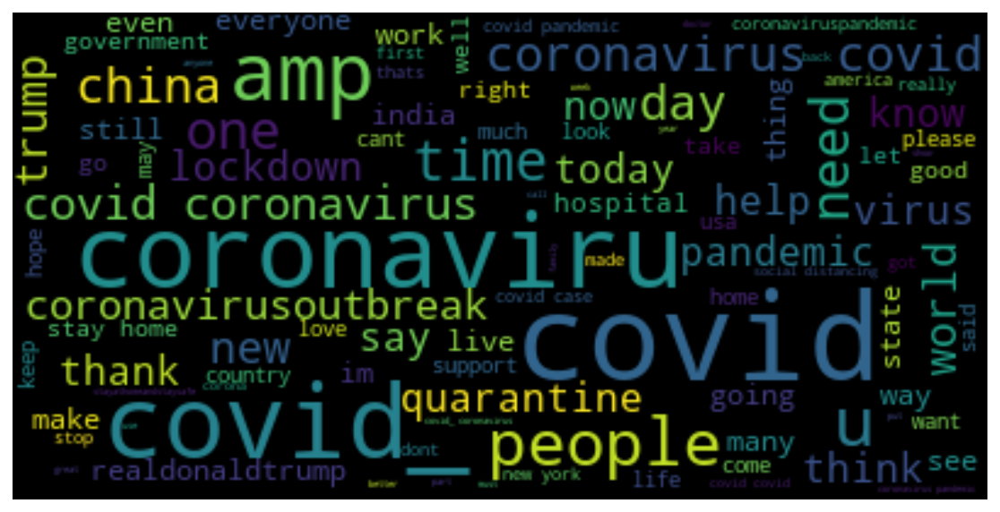

In [45]:
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator

tweet_All = " ".join(review for review in df_new.text)


fig, ax = plt.subplots(1, 1, figsize  = (16,5))
# Create and generate a word cloud image:
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(tweet_All)

# Display the generated image:
ax.imshow(wordcloud_ALL, interpolation='bilinear')

ax.axis('off')

In [46]:
df_new['text']

0        workers supporting operation firearm ammunitio...
1        breaking sample taken maldivian national arriv...
2        im beginning understand need shirley temple co...
3          the hero need greenlegocats minigunneryt covid_
4        meme shitlords sharing umbrella corp coronavir...
                               ...                        
56613    tonight lps members recognize efforts healthca...
56614    some local kids decorated icu bulletin board r...
56615    lets make clear realdonaldtrump wants signatur...
56616    govpritzker so telling us office concerned us ...
56617                    anyone else tired covid topic day
Name: text, Length: 56618, dtype: object

In [47]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
2,Positive,24582
0,Negative,19042
1,Neutral,12994


<AxesSubplot:xlabel='sentiment', ylabel='count'>

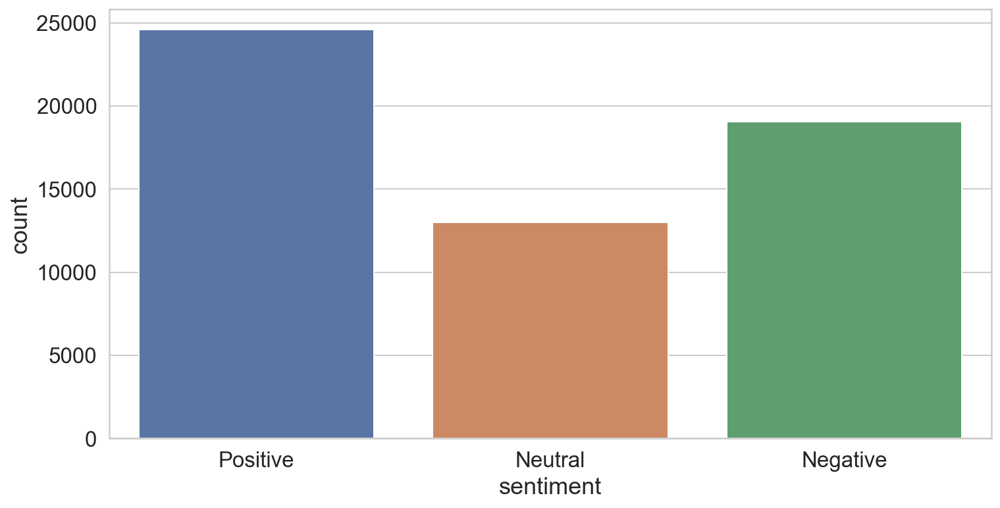

In [48]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [49]:
import plotly.graph_objs as go

fig = go.Figure(go.Funnelarea(
    text =temp.sentiment,
    values = temp.text,
    title = {"position": "top center", "text": "Funnel-Chart of Sentiment Distribution"}
    ))
fig.show()

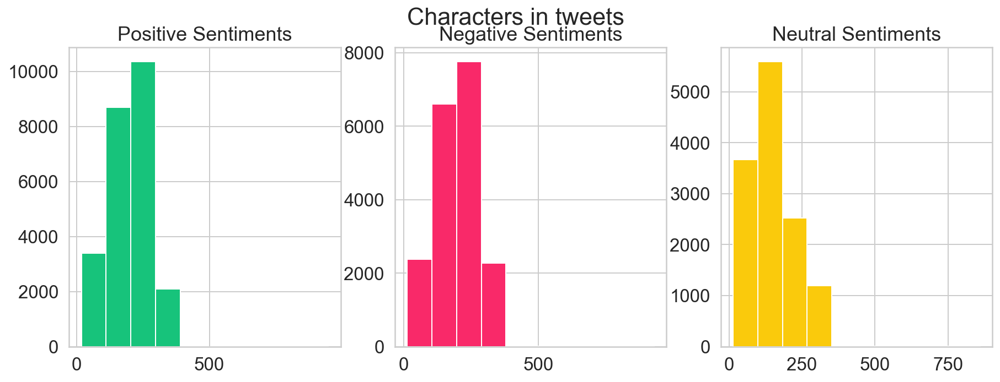

In [50]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.len()
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')

tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.len()
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.len()
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Characters in tweets')
plt.show()

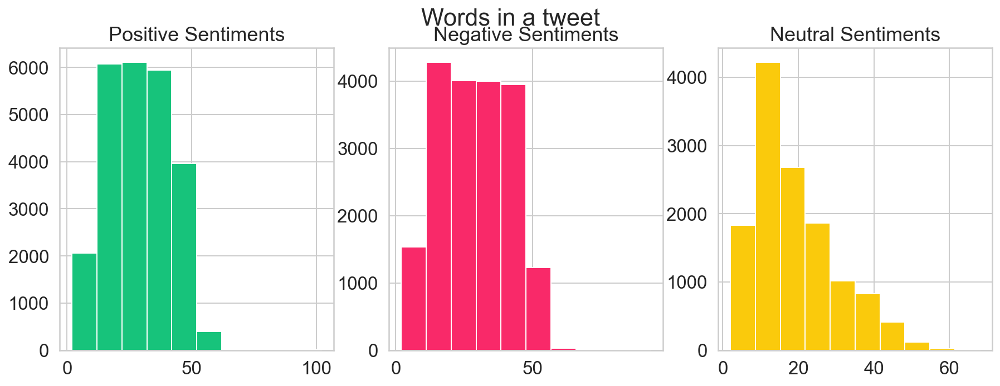

In [51]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().map(lambda x: len(x))
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')


tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().map(lambda x: len(x))
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.split().map(lambda x: len(x))
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Words in a tweet')
plt.show()

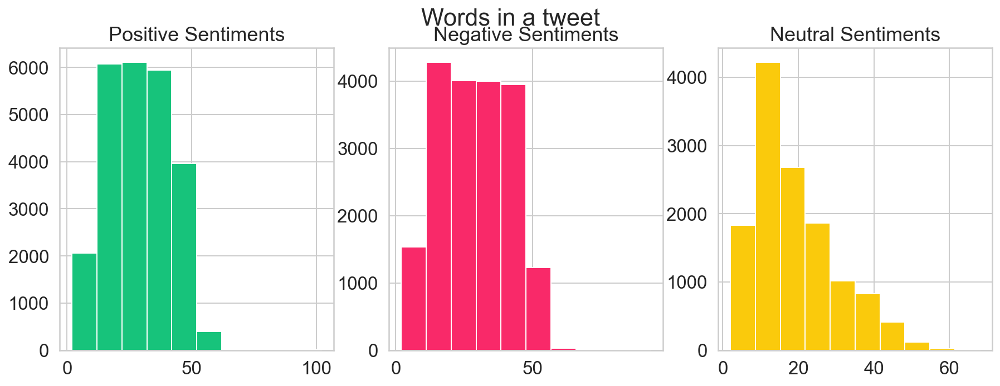

In [52]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().map(lambda x: len(x))
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')


tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().map(lambda x: len(x))
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.split().map(lambda x: len(x))
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Words in a tweet')
plt.show()

Text(0.5, 0.98, 'Average word length in each tweet')

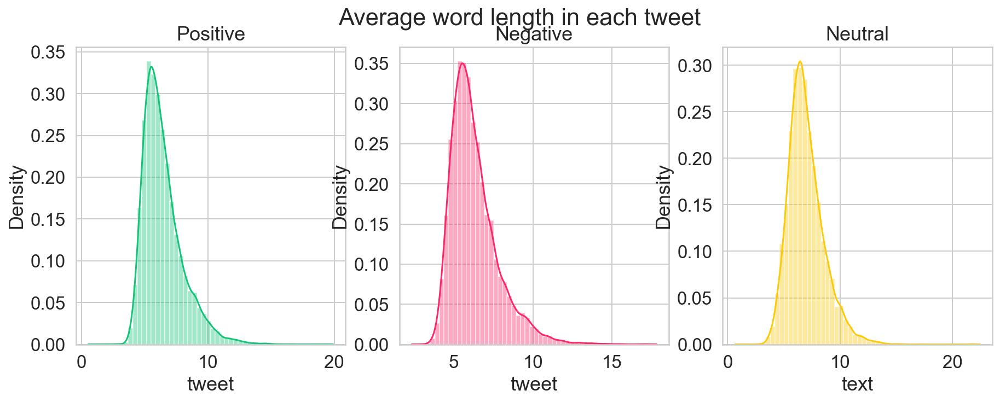

In [53]:
fig,(ax1,ax2, ax3)=plt.subplots(1,3,figsize=(15,5))

word=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='#17C37B')
ax1.set_title('Positive')


word=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='#F92969')
ax2.set_title('Negative')

word=df_new[df_new['sentiment']=="Neutral"]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax3,color='#FACA0C')
ax3.set_title('Neutral')


fig.suptitle('Average word length in each tweet')

In [54]:
np.array(stopwords)

array({'these', 'a', 'don', 'this', 'all', 'we', 'more', "hasn't", 'do', 'is', 'during', 'no', 'against', 'just', 'same', 'you', 'as', 'that', 'the', 'how', 'can', 'have', 'she', 'before', "didn't", 'where', 'doing', 'hers', 'on', 'over', 'your', 'out', 'which', 't', "mustn't", 'doesn', "don't", 'being', 'their', 'wouldn', 'at', "doesn't", 'herself', 'and', 'under', 'from', 'here', 'it', 'too', 'any', 'hadn', 'most', 'whom', "you've", "you'll", 'o', "couldn't", "wouldn't", "should've", 'why', 'did', 'haven', 'above', "aren't", 'him', 'own', 'each', "weren't", 'such', 'again', 'isn', 'those', 'only', "mightn't", "you're", "won't", 'there', 'nor', 'ain', "hadn't", 'our', 'yours', 'now', 'to', 'or', 'off', 'mightn', 'of', 'other', "shouldn't", 'yourself', 'them', 'down', 'should', 'through', 'ma', "she's", 'myself', 'has', 'ours', 'yourselves', 'then', 'when', 'shouldn', 'having', 'been', 'some', "it's", 'what', 'does', 'didn', 'm', 'were', "haven't", 'both', 'shan', 'themselves', 'had', 

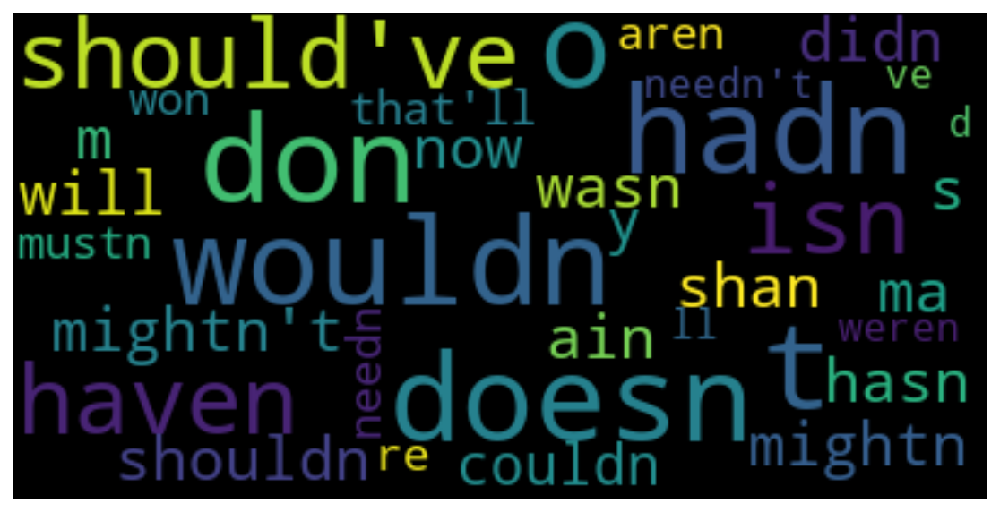

In [55]:
comment_words = '' 
stopwords1 = set(STOPWORDS) 
  
for val in stopwords: 
      
    # typecaste each val to string 
    val = str(val) 
    # split the value 
    tokens = val.split() 
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
fig, ax = plt.subplots(1, 1, figsize  = (16,5))
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(comment_words)



# plot the WordCloud image                        
ax.imshow(wordcloud_ALL, interpolation='bilinear')
ax.axis('off')
  
plt.show() 

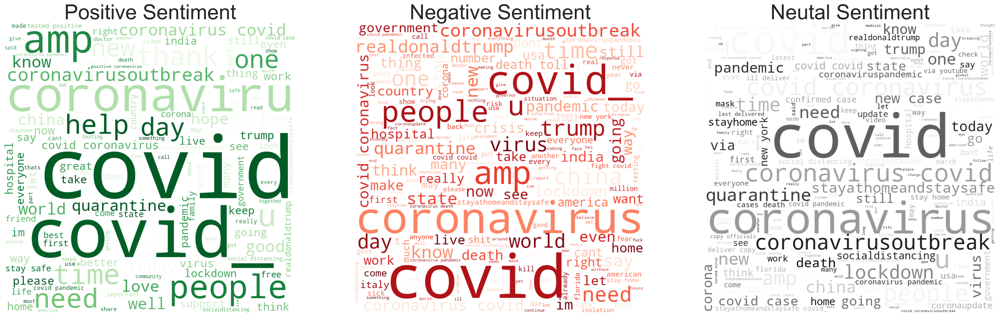

In [56]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=[30, 15])

df_pos = df_new[df_new["sentiment"]=="Positive"]
df_neg = df_new[df_new["sentiment"]=="Negative"]
df_neu = df_new[df_new["sentiment"]=="Neutral"]

comment_words = '' 
stopwords = set(STOPWORDS) 

for val in df_pos.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
   
wordcloud1 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greens",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 

ax1.imshow(wordcloud1)
ax1.axis('off')
ax1.set_title('Positive Sentiment',fontsize=35);

comment_words = ''

for val in df_neg.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud2 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Reds",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words)  
ax2.imshow(wordcloud2)
ax2.axis('off')
ax2.set_title('Negative Sentiment',fontsize=35);

comment_words = ''
for val in df_neu.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud3 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greys",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
ax3.imshow(wordcloud3)
ax3.axis('off')
ax3.set_title('Neutal Sentiment',fontsize=35);

In [57]:
from collections import defaultdict

# Define functions
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(' ') if token != '' if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

N = 30


positive= df_new["sentiment"]== "Positive"
negative= df_new["sentiment"]== "Negative"
neutral= df_new["sentiment"]== "Neutral"

positive_unigrams = defaultdict(int)
neutral_unigrams = defaultdict(int)
negative_unigrams = defaultdict(int)

# Unigrams
for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet):
        positive_unigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet):
        negative_unigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet):
        neutral_unigrams[word] += 1        
        
df_positive_unigrams = pd.DataFrame(sorted(positive_unigrams.items(), key=lambda x: x[1])[::-1])
df_negative_unigrams = pd.DataFrame(sorted(negative_unigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_unigrams = pd.DataFrame(sorted(neutral_unigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=150)
plt.tight_layout()

sns.barplot(y=df_positive_unigrams[0].values[:N], x=df_positive_unigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_unigrams[0].values[:N], x=df_negative_unigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_unigrams[0].values[:N], x=df_neutral_unigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common unigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common unigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common unigrams in Neutral Tweets', fontsize=15)

plt.show()

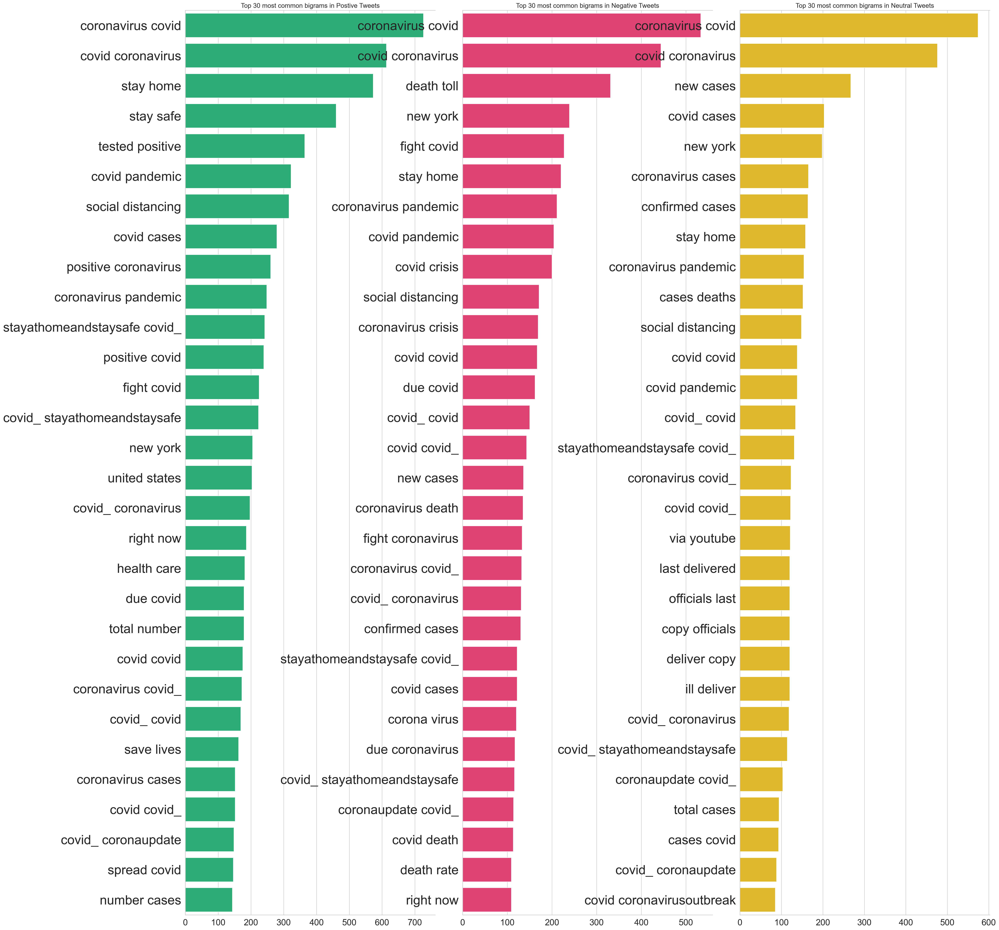

In [58]:
# Bigrams
positive_bigrams = defaultdict(int)
neutral_bigrams = defaultdict(int)
negative_bigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        positive_bigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        negative_bigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        neutral_bigrams[word] += 1        
        
df_positive_bigrams = pd.DataFrame(sorted(positive_bigrams.items(), key=lambda x: x[1])[::-1])
df_negative_bigrams = pd.DataFrame(sorted(negative_bigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_bigrams = pd.DataFrame(sorted(neutral_bigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_bigrams[0].values[:N], x=df_positive_bigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_bigrams[0].values[:N], x=df_negative_bigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_bigrams[0].values[:N], x=df_neutral_bigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common bigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common bigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common bigrams in Neutral Tweets', fontsize=15)

plt.show()

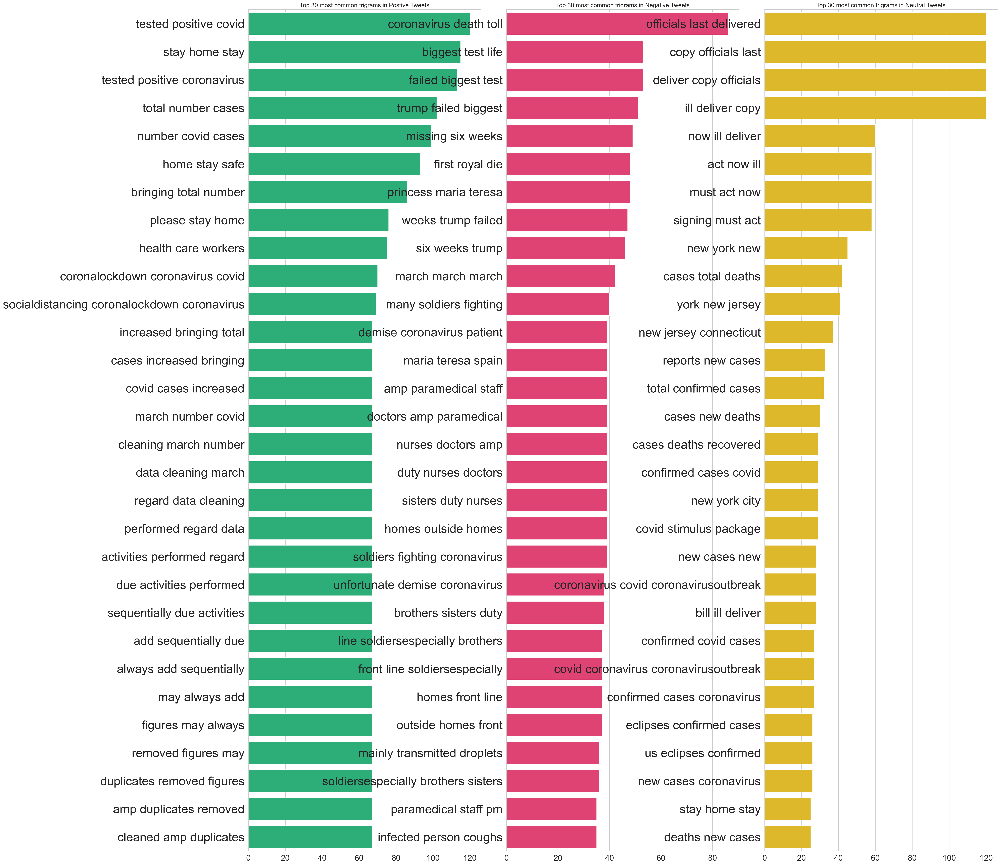

In [59]:
# Trigrams
positive_trigrams = defaultdict(int)
neutral_trigrams = defaultdict(int)
negative_trigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        positive_trigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        negative_trigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        neutral_trigrams[word] += 1        
        
df_positive_trigrams = pd.DataFrame(sorted(positive_trigrams.items(), key=lambda x: x[1])[::-1])
df_negative_trigrams = pd.DataFrame(sorted(negative_trigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_trigrams = pd.DataFrame(sorted(neutral_trigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_trigrams[0].values[:N], x=df_positive_trigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_trigrams[0].values[:N], x=df_negative_trigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_trigrams[0].values[:N], x=df_neutral_trigrams[1].values[:N], ax=axes[2], color='#FACA0C')




for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common trigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common trigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common trigrams in Neutral Tweets', fontsize=15)

plt.show()

In [60]:
df_new.head()

,user_name,tweet,lang\r,tweets_count,date,time,text,sentiment
0,heather_hear,“[w]orkers supporting the operation of firearm...,en\r,8,2020-03-29,02:17:02+00:00,workers supporting operation firearm ammunitio...,Positive
1,shiusolih,BREAKING : Sample taken from a Maldivian natio...,en\r,1,2020-03-29,05:36:53+00:00,breaking sample taken maldivian national arriv...,Positive
2,Hailedbycritics,I’m beginning to understand the need for Shirl...,en\r,1,2020-03-29,01:03:19+00:00,im beginning understand need shirley temple co...,Neutral
3,DoctorCommunist,The hero we need. @greenlegocats @MinigunnerYT...,en\r,1,2020-03-29,00:22:12+00:00,the hero need greenlegocats minigunneryt covid_,Positive
4,LiquidD81,Meme shitlords were sharing this Umbrella Corp...,en\r,1,2020-03-29,02:07:00+00:00,meme shitlords sharing umbrella corp coronavir...,Negative


In [61]:
df_new = df_new.drop(df_new[df_new.tweets_count >= 10].index)

In [62]:
#As words are in the order of csv files we imported , we have to shuffle the rows & Reindex

df_new = df_new.sample(frac=1).reset_index(drop=True)
df_new.head()

,user_name,tweet,lang\r,tweets_count,date,time,text,sentiment
0,mistysmog,@JacyFranklyn In Feb. Canada sent medical supp...,en\r,2,2020-03-29,02:10:56+00:00,jacyfranklyn in feb canada sent medical suppli...,Positive
1,odtreoskltation,#PicOfTheDay #cashlesssociety #changethesystem...,en\r,2,2020-03-29,04:03:07+00:00,picoftheday cashlesssociety changethesystem re...,Neutral
2,kuw_icx,@giacomozucco This is why they want you to pan...,en\r,1,2020-03-29,04:34:04+00:00,giacomozucco this want panic go covid_ hysteria,Negative
3,CynnGMoc,1 day someone said: we must try not to sink un...,en\r,1,2020-03-29,05:00:12+00:00,day someone said must try sink weight tribulat...,Negative
4,Sunylou,#Drones . Anyone who has drones?Secure our fro...,en\r,3,2020-03-29,00:12:01+00:00,drones anyone dronessecure frontliners good he...,Positive


In [63]:
print(df_new)

             user_name                                              tweet  \
0            mistysmog  @JacyFranklyn In Feb. Canada sent medical supp...   
1      odtreoskltation  #PicOfTheDay #cashlesssociety #changethesystem...   
2              kuw_icx  @giacomozucco This is why they want you to pan...   
3             CynnGMoc  1 day someone said: we must try not to sink un...   
4              Sunylou  #Drones . Anyone who has drones?Secure our fro...   
...                ...                                                ...   
53052       LIONSROAR6  @iMac_too Kejriwal done a stupid job by riskin...   
53053      LeisureOpps  Physical activity sector leaders welcome help ...   
53054    amariecannata  I predict Mike Pence getting sick and dying fr...   
53055       LibraFresh  A positive attitude will create more miracles ...   
53056     Moby33102097  #Coronavirus lots of numbers no PROOF of body'...   

      lang\r  tweets_count        date            time  \
0       en\r     

In [64]:
df_new_final = pd.concat([df_new.iloc[0:40000]])

In [65]:
len(df_new_final)

40000

In [66]:
export_csv = df_new_final.to_csv(r'covid19 march tweets.csv')

In [67]:
# df_new_final.drop(df_new_final.columns[[0,2,3,4,5,6,7]], axis=1, inplace=True)
